In [6]:
from flaml import AutoML
from sklearn.metrics import f1_score
import pandas as pd

# Definir una función de métrica personalizada que use 'weighted'
def weighted_f1(X_val, y_val, estimator, labels, X_train, y_train, weight_val=None, weight_train=None, config=None, groups_val=None, groups_train=None):
    y_pred = estimator.predict(X_val)
    score = f1_score(y_val, y_pred, average='weighted')
    return 1 - score, {'weighted_f1': score}  # FLAML minimizes the metric, so we return 1 - score

# df_train = pd.read_csv('data/train_timeseries_interpolated.csv')
# df_val = pd.read_csv('data/val_timeseries_interpolated.csv')
# df_test = pd.read_csv('data/test_timeseries_interpolated.csv')

# # Dividir los datos en características y etiquetas
# X_train, y_train = df_train.drop(columns=['score','score_interpolated','score_final_interpolated']), df_train['score_final_interpolated']
# X_val, y_val = df_val.drop(columns=['score','score_interpolated','score_final_interpolated']), df_val['score_final_interpolated']
# X_test, y_test = df_test.drop(columns=['score','score_interpolated','score_final_interpolated']), df_test['score_final_interpolated']

# X_train_val = pd.concat([X_train, X_val])
# y_train_val = pd.concat([y_train, y_val])


# Crear un objeto AutoML
automl = AutoML()

# Configurar los parámetros para FLAML
settings = {
    "time_budget": 600,  # Tiempo límite en segundos (10 minutos en este caso)
    "metric": weighted_f1,  # Métrica personalizada con 'weighted' f1
    "task": 'classification',  # Especificamos que es una tarea de clasificación
    "log_file_name": "flaml_timeseries_classification.log",  # Archivo de log
    "eval_method": "cv",  # Usamos validación cruzada
    "n_splits": 3,  # Número de particiones para la validación cruzada
    "estimator_list": ['lgbm', 'xgboost', 'rf'],  # Algoritmos a probar (puedes ajustar)
}

# Entrenar el modelo usando FLAML en el conjunto de entrenamiento y validación
automl.fit(X_train_val, y_train_val, **settings)

# Hacer predicciones en el conjunto de prueba
y_pred = automl.predict(X_test)

# Evaluar el rendimiento del modelo en los datos de prueba usando f1_score con average='weighted'
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"F1 Score (weighted) en el conjunto de prueba: {f1:.4f}")

# Mostrar el mejor modelo encontrado y otros detalles
print("Mejor estimador:", automl.best_estimator)
print("Mejor configuración de hiperparámetros:", automl.best_config)
print("Mejor métrica:", automl.best_loss)

[flaml.automl.logger: 09-13 23:13:17] {1680} INFO - task = classification
[flaml.automl.logger: 09-13 23:13:17] {1691} INFO - Evaluation method: cv
[flaml.automl.logger: 09-13 23:13:21] {1789} INFO - Minimizing error metric: customized metric
[flaml.automl.logger: 09-13 23:13:21] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'xgboost', 'rf']
[flaml.automl.logger: 09-13 23:13:21] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 09-13 23:13:47] {2345} INFO - Estimated sufficient time budget=257271s. Estimated necessary time budget=257s.
[flaml.automl.logger: 09-13 23:13:47] {2392} INFO -  at 62.5s,	estimator lgbm's best error=0.5304,	best estimator lgbm's best error=0.5304
[flaml.automl.logger: 09-13 23:13:47] {2219} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-13 23:14:13] {2392} INFO -  at 88.4s,	estimator lgbm's best error=0.5304,	best estimator lgbm's best error=0.5304
[flaml.automl.logger: 09-13 23:14:13] {2219} INFO - iteration 

AttributeError: 'AutoML' object has no attribute 'time_taken'

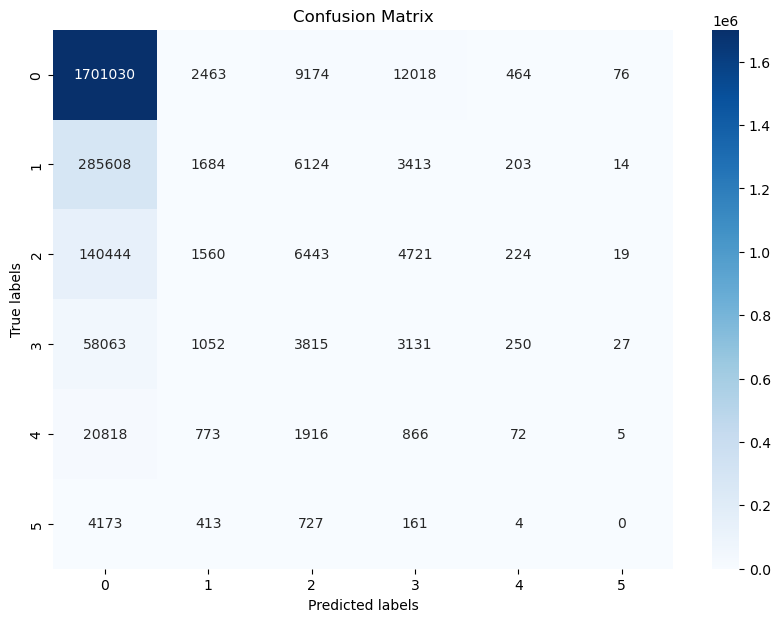

In [7]:
# multiclass classification confussion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


In [9]:
# Ahora intento lo mismo pero joineando el dataset de soil_data

df_soil = pd.read_csv('data/soil_data.csv')

# Definir una función de métrica personalizada que use 'weighted'
def weighted_f1(X_val, y_val, estimator, labels, X_train, y_train, weight_val=None, weight_train=None, config=None, groups_val=None, groups_train=None):
    y_pred = estimator.predict(X_val)
    score = f1_score(y_val, y_pred, average='weighted')
    return 1 - score, {'weighted_f1': score}  # FLAML minimizes the metric, so we return 1 - score

df_train = pd.read_csv('data/train_timeseries_interpolated.csv')
df_val = pd.read_csv('data/val_timeseries_interpolated.csv')
df_test = pd.read_csv('data/test_timeseries_interpolated.csv')

# Dividir los datos en características y etiquetas
X_train, y_train = df_train.drop(columns=['score','score_interpolated','score_final_interpolated']), df_train['score_final_interpolated']
X_val, y_val = df_val.drop(columns=['score','score_interpolated','score_final_interpolated']), df_val['score_final_interpolated']
X_test, y_test = df_test.drop(columns=['score','score_interpolated','score_final_interpolated']), df_test['score_final_interpolated']

X_train_val = pd.concat([X_train, X_val])
y_train_val = pd.concat([y_train, y_val])

X_train_val = pd.merge(X_train_val, df_soil, on='fips')
X_test = pd.merge(X_test, df_soil, on='fips')

# Crear un objeto AutoML
automl = AutoML()

# Configurar los parámetros para FLAML
settings = {
    "time_budget": 600,  # Tiempo límite en segundos (10 minutos en este caso)
    "metric": weighted_f1,  # Métrica personalizada con 'weighted' f1
    "task": 'classification',  # Especificamos que es una tarea de clasificación
    "log_file_name": "flaml_timeseries_classification.log",  # Archivo de log
    "eval_method": "cv",  # Usamos validación cruzada
    "n_splits": 3,  # Número de particiones para la validación cruzada
    "estimator_list": ['lgbm', 'xgboost', 'rf'],  # Algoritmos a probar (puedes ajustar)
}

# Entrenar el modelo usando FLAML en el conjunto de entrenamiento y validación
automl.fit(X_train_val, y_train_val, **settings)

# Hacer predicciones en el conjunto de prueba
y_pred = automl.predict(X_test)

# Evaluar el rendimiento del modelo en los datos de prueba usando f1_score con average='weighted'
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"F1 Score (weighted) en el conjunto de prueba: {f1:.4f}")

# Mostrar el mejor modelo encontrado y otros detalles
print("Mejor estimador:", automl.best_estimator)
print("Mejor configuración de hiperparámetros:", automl.best_config)
print("Mejor métrica:", automl.best_loss)

[flaml.automl.logger: 09-14 00:40:07] {1680} INFO - task = classification
[flaml.automl.logger: 09-14 00:40:07] {1691} INFO - Evaluation method: cv
[flaml.automl.logger: 09-14 00:40:18] {1789} INFO - Minimizing error metric: customized metric
[flaml.automl.logger: 09-14 00:40:18] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'xgboost', 'rf']
[flaml.automl.logger: 09-14 00:40:18] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 09-14 00:41:09] {2345} INFO - Estimated sufficient time budget=513867s. Estimated necessary time budget=514s.
[flaml.automl.logger: 09-14 00:41:09] {2392} INFO -  at 141.8s,	estimator lgbm's best error=0.5304,	best estimator lgbm's best error=0.5304
[flaml.automl.logger: 09-14 00:41:09] {2219} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-14 00:42:01] {2392} INFO -  at 193.6s,	estimator lgbm's best error=0.5304,	best estimator lgbm's best error=0.5304
[flaml.automl.logger: 09-14 00:42:01] {2219} INFO - iteratio

In [18]:
# multiclass classification confussion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

best_model = automl.model
y_pred = best_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"F1 Score (weighted) en el conjunto de prueba: {f1:.4f}")


ValueError: train and valid dataset categorical_feature do not match.

In [20]:
import pandas as pd
import math

df_soil = pd.read_csv('data/soil_data.csv')
# Defino la longitud contra la que voy a calcular la distancia
long = -101.42677293486523

def get_distance_to_long_with_sign(row, long_ref, radio_tierra=6371):
    # Convertir las coordenadas de la fila a radianes
    lat1 = math.radians(row['lat'])
    lon1 = math.radians(row['lon'])

    # Diferencia en la longitud
    dlon = lon1 - long_ref

    # Distancia en el paralelo (considerando la latitud constante)
    distancia = radio_tierra * math.cos(lat1) * dlon

    # Asignar signo según la dirección (oeste o este)
    return distancia

# Ejemplo de uso con un DataFrame de ejemplo
long_ref = -101.42677293486523  # Longitud de referencia en grados

# Convertir longitud y latitud de referencia a radianes
long_ref = math.radians(long_ref)

# Aplicar la función a cada fila del DataFrame
df_soil['distance_to_long'] = df_soil.apply(lambda x: get_distance_to_long_with_sign(x, long_ref), axis=1)

print(df_soil[['distance_to_long','lat','lon','fips']].head())



   distance_to_long        lat        lon  fips
0       1385.733980  32.536382 -86.644490  1001
1       1512.915573  31.870670 -85.405456  1005
2       1308.581325  30.659218 -87.746067  1003
3       1333.284301  33.015893 -87.127148  1007
4       1370.185673  33.977448 -86.567246  1009


In [2]:
from shapely.geometry import Point
import geopandas as gpd
import pandas as pd



# Crear una columna 'geometry' usando los puntos (lon, lat)
df_soil['geometry'] = df_soil.apply(lambda x: Point((x['lon'], x['lat'])), axis=1)

# Convertir a GeoDataFrame
gdf_soil = gpd.GeoDataFrame(df_soil, geometry='geometry')

# Visualizar el mapa interactivo usando explore()
gdf_soil.explore(column="distance_to_long", tooltip=["lat", "lon", "distance_to_long", "fips"], tiles="OpenStreetMap")

In [21]:

X_train_val = pd.merge(X_train_val, df_soil[["distance_to_long", "fips"]], on='fips')
X_test = pd.merge(X_test, df_soil[["distance_to_long", "fips"]], on='fips')

# Crear un objeto AutoML
automl = AutoML()

# Configurar los parámetros para FLAML
settings = {
    "time_budget": 600,  # Tiempo límite en segundos (10 minutos en este caso)
    "metric": weighted_f1,  # Métrica personalizada con 'weighted' f1
    "task": 'classification',  # Especificamos que es una tarea de clasificación
    "log_file_name": "flaml_timeseries_classification.log",  # Archivo de log
    "eval_method": "cv",  # Usamos validación cruzada
    "n_splits": 3,  # Número de particiones para la validación cruzada
    "estimator_list": ['lgbm', 'xgboost', 'rf'],  # Algoritmos a probar (puedes ajustar)
}

# Entrenar el modelo usando FLAML en el conjunto de entrenamiento y validación
automl.fit(X_train_val, y_train_val, **settings)

# Hacer predicciones en el conjunto de prueba
y_pred = automl.predict(X_test)

# Evaluar el rendimiento del modelo en los datos de prueba usando f1_score con average='weighted'
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"F1 Score (weighted) en el conjunto de prueba: {f1:.4f}")

# Mostrar el mejor modelo encontrado y otros detalles
print("Mejor estimador:", automl.best_estimator)
print("Mejor configuración de hiperparámetros:", automl.best_config)
print("Mejor métrica:", automl.best_loss)

[flaml.automl.logger: 09-14 01:01:10] {1680} INFO - task = classification
[flaml.automl.logger: 09-14 01:01:10] {1691} INFO - Evaluation method: cv
[flaml.automl.logger: 09-14 01:01:21] {1789} INFO - Minimizing error metric: customized metric
[flaml.automl.logger: 09-14 01:01:21] {1901} INFO - List of ML learners in AutoML Run: ['lgbm', 'xgboost', 'rf']
[flaml.automl.logger: 09-14 01:01:21] {2219} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 09-14 01:02:12] {2345} INFO - Estimated sufficient time budget=510184s. Estimated necessary time budget=510s.
[flaml.automl.logger: 09-14 01:02:12] {2392} INFO -  at 124.0s,	estimator lgbm's best error=0.5304,	best estimator lgbm's best error=0.5304
[flaml.automl.logger: 09-14 01:02:12] {2219} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-14 01:03:04] {2392} INFO -  at 175.5s,	estimator lgbm's best error=0.5304,	best estimator lgbm's best error=0.5304
[flaml.automl.logger: 09-14 01:03:04] {2219} INFO - iteratio

In [22]:
# multiclass classification confussion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

best_model = automl.model
y_pred = best_model.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"F1 Score (weighted) en el conjunto de prueba: {f1:.4f}")


ValueError: train and valid dataset categorical_feature do not match.

In [2]:
# leemos los arhivos de train, val y test
import pandas as pd
df_train = pd.read_csv('data/train_timeseries.csv')
df_val = pd.read_csv('data/validation_timeseries.csv')
df_test = pd.read_csv('data/test_timeseries.csv')

In [5]:
# comparo validacion y test con sweetviz compare
import sweetviz as sv
report = sv.compare([df_val, "Validation"], [df_test, "Test"])
# guardo el reporte
report.show_html('compare.html', open_browser=False, layout='widescreen', scale=0.8, relative_to='.')

                                             |          | [  0%]   00:00 -> (? left)

TypeError: DataframeReport.show_html() got an unexpected keyword argument 'show_inline'


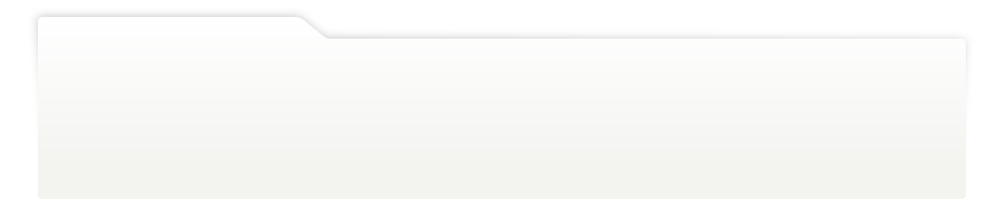
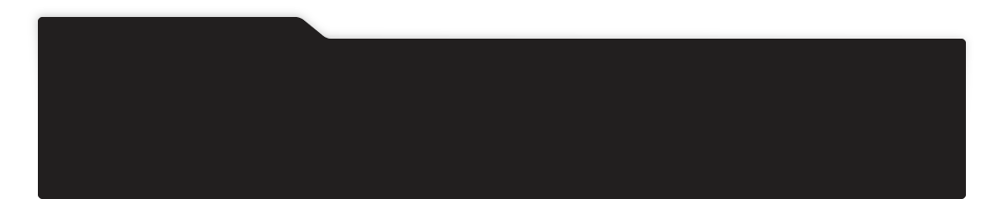
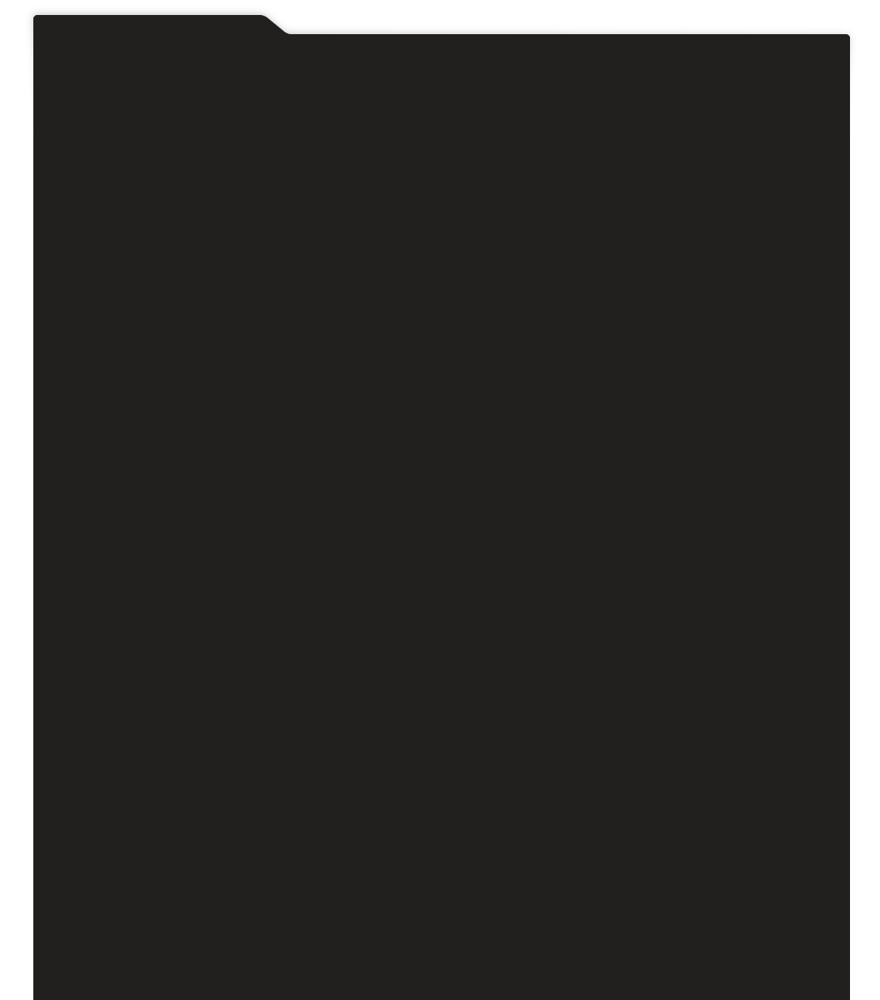
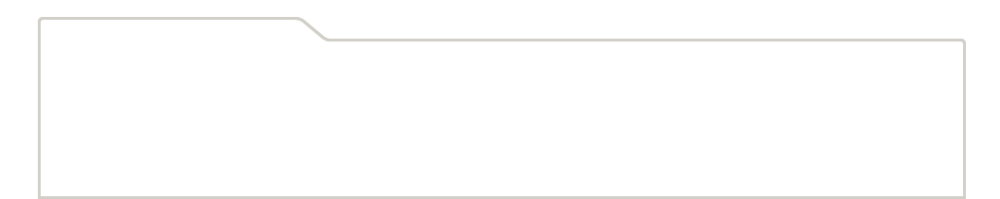
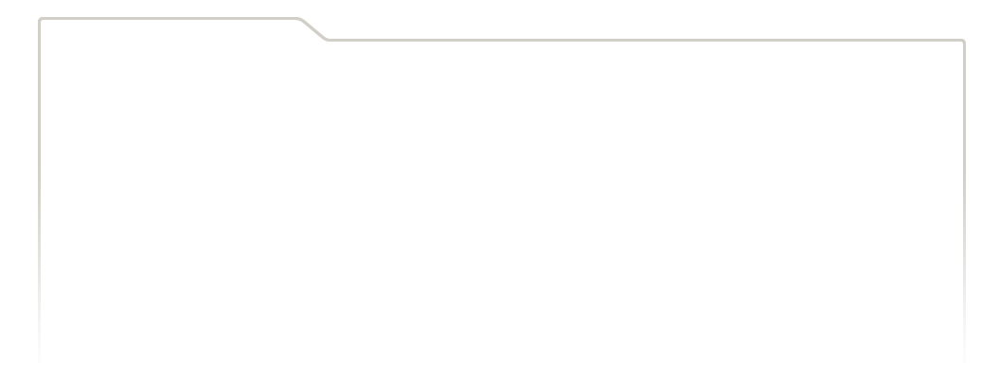
...
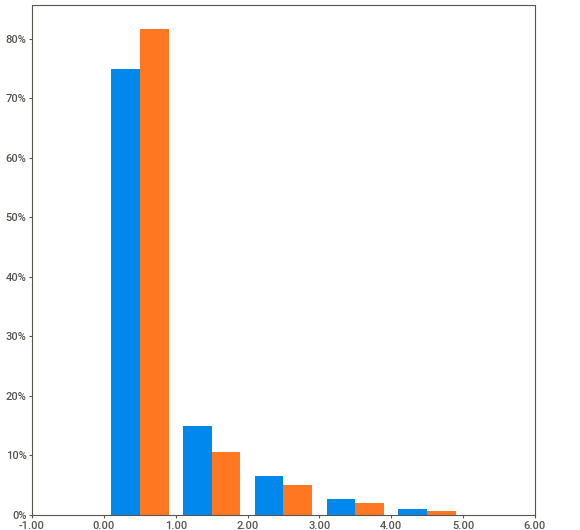
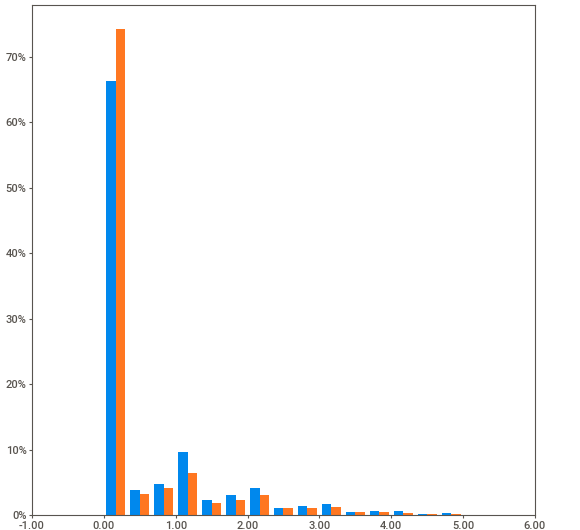
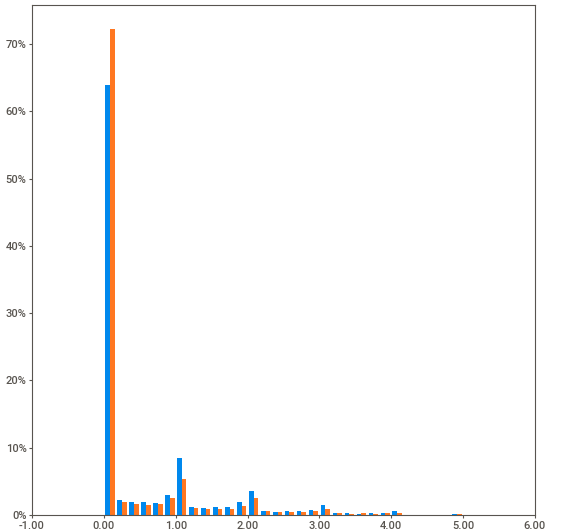
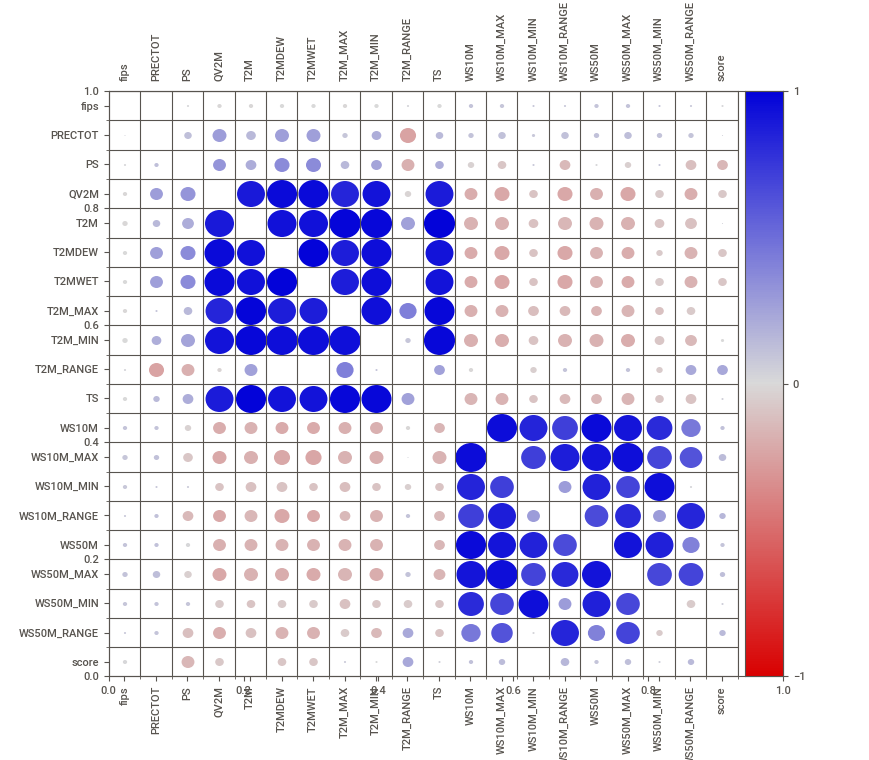
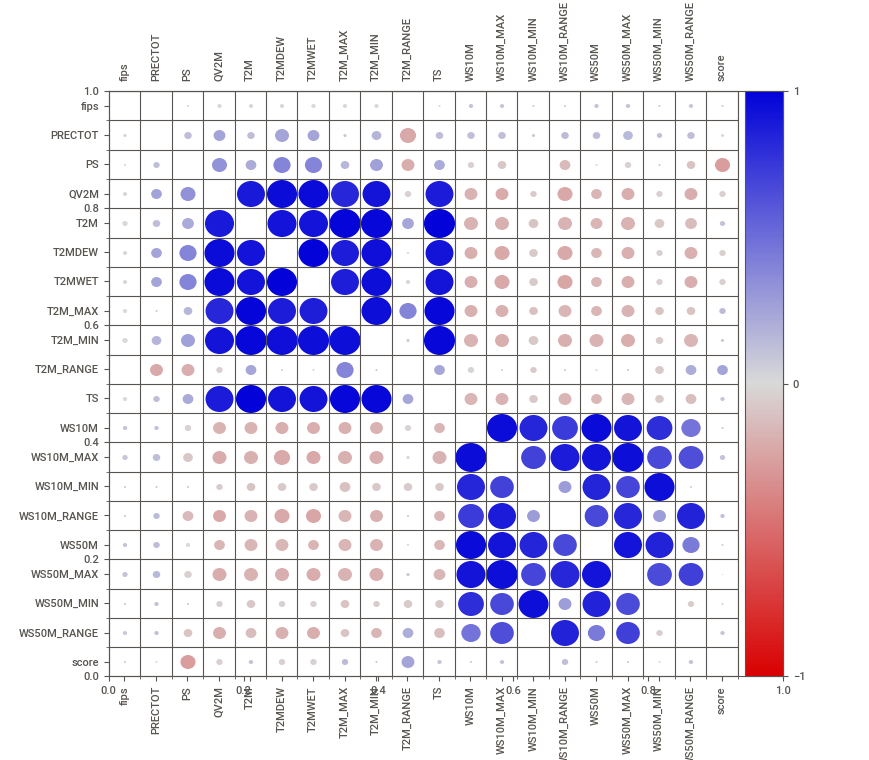

In [7]:
report.show_notebook()

In [3]:
# Ordenamos df_train por el campo fecha (date) de forma descendente
df_train = df_train.sort_values('date', ascending=False)

# Creo un df_train_copy con los ultimos 4 años de datos
df_train_copy = df_train[df_train['date'] >= '2012-01-01']

In [4]:
min(df_train.date),max(df_train.date)

('2000-01-01', '2016-12-31')

                                             |          | [  0%]   00:00 -> (? left)


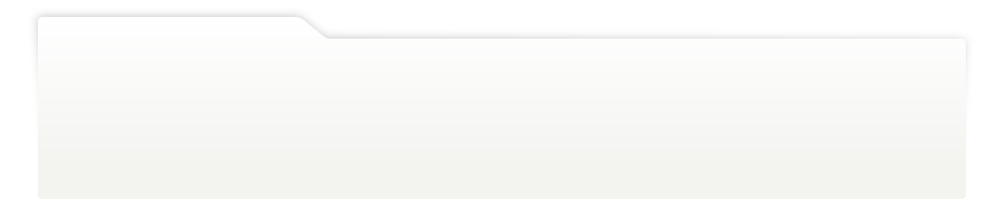
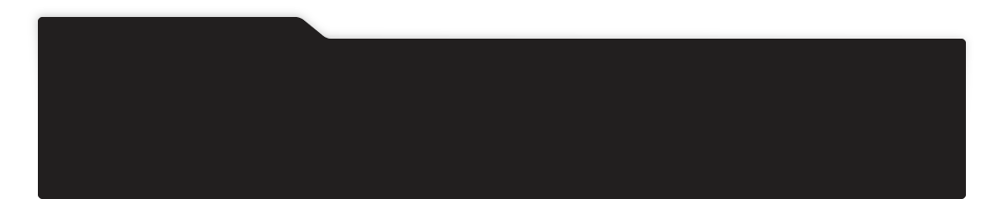
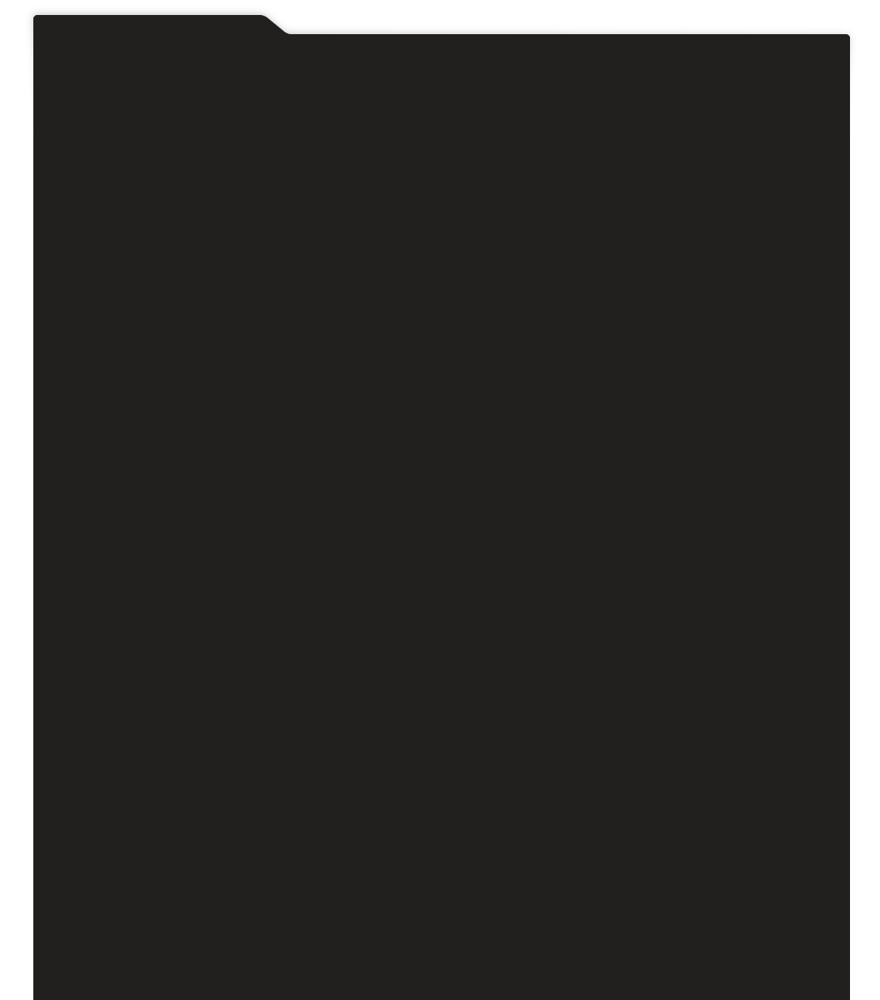
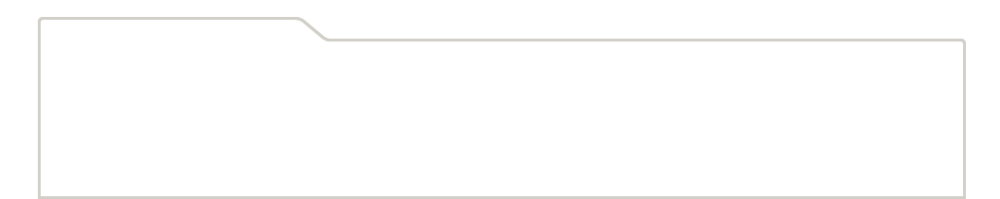
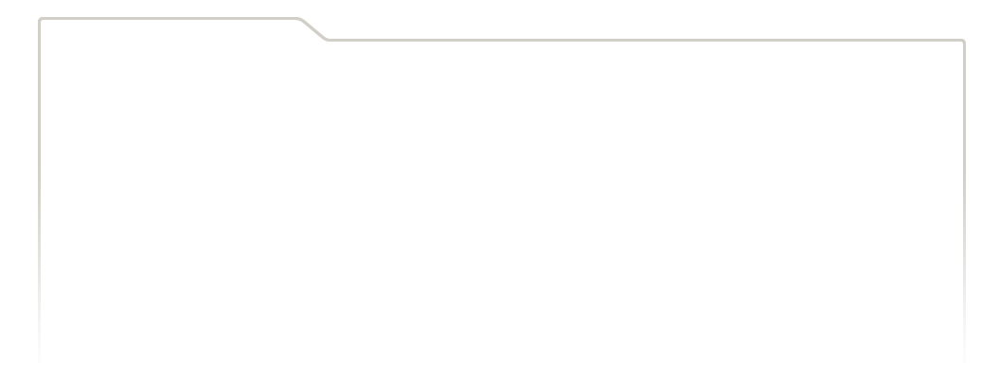
...
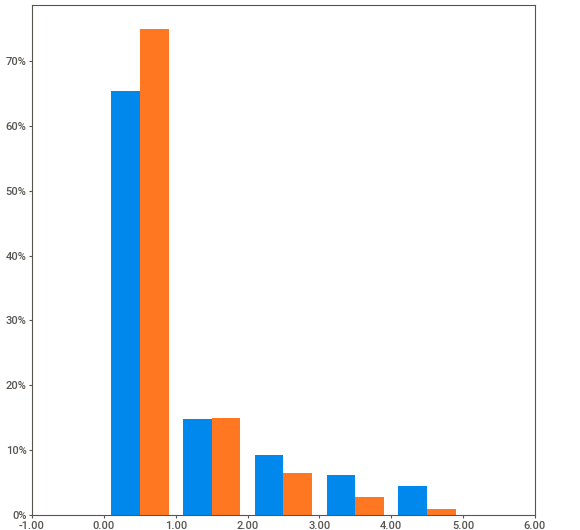
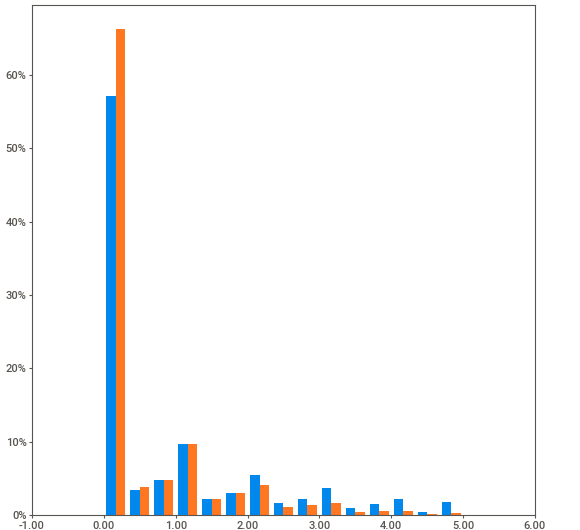
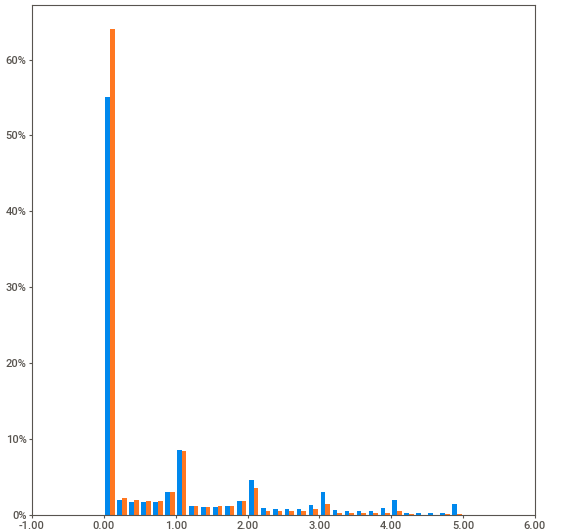
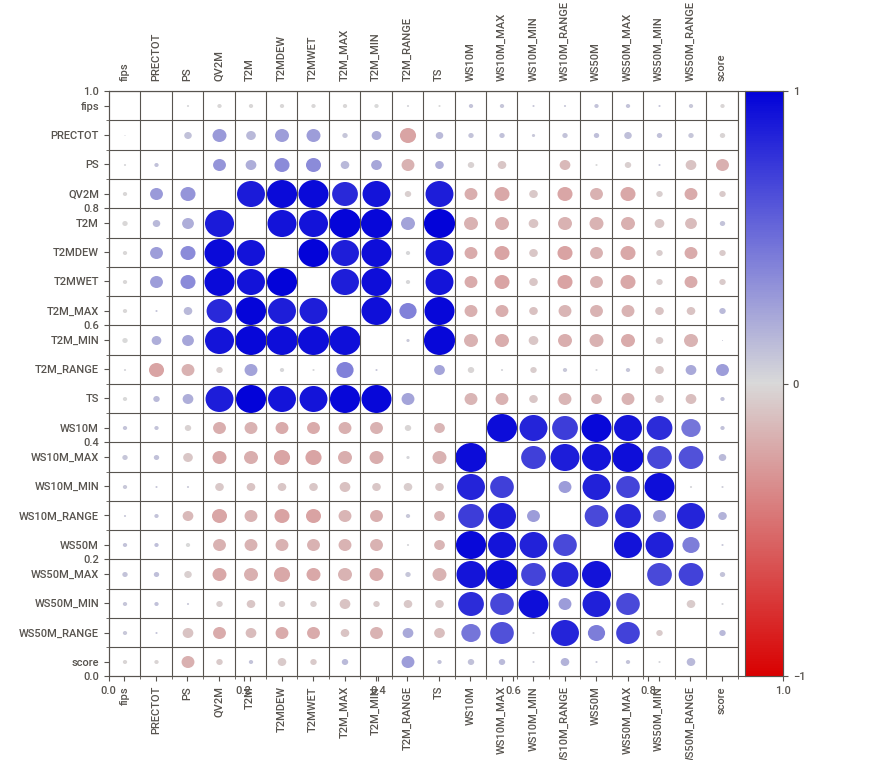
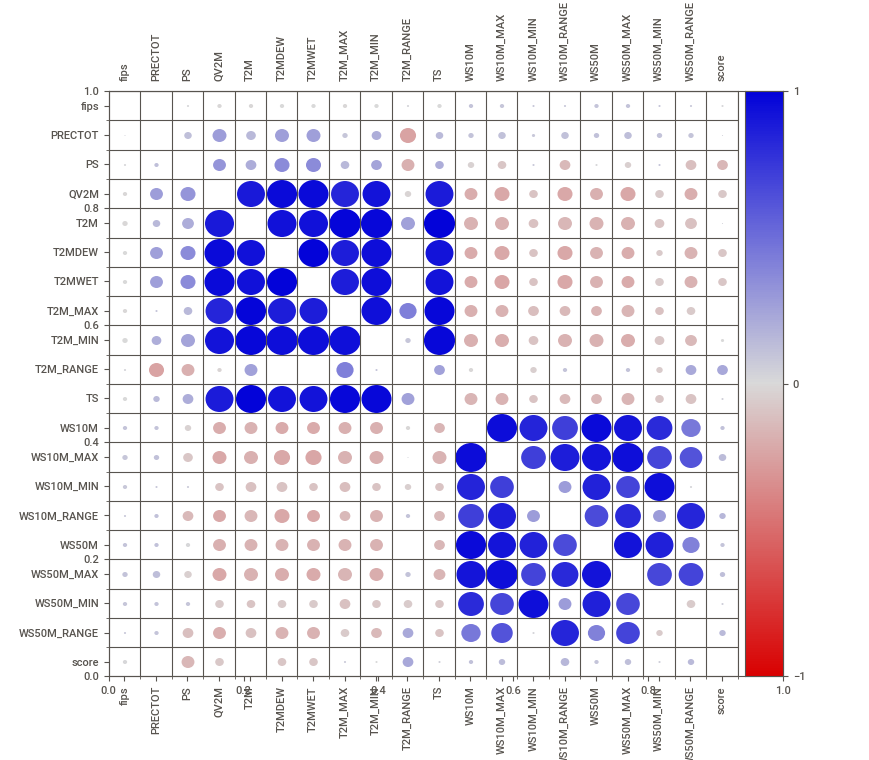

In [22]:
# comparo train_copy con val usando sweetviz
report = sv.compare([df_train_copy, "Train"], [df_val, "Validation"])
# guardo el reporte
report.show_notebook()

In [39]:
df_1001=df_train[df_train['fips'] == 1001]

In [45]:
# Uso div anidados para visualizar dos datasets en una misma celda uno al lado del otro
import pandas as pd
from IPython.display import HTML

# Crear una estructura HTML con dos columnas, cada una con un DataFrame
html = """
<div style="display: flex; justify-content: space-between;">
  <div>
    {}
  </div>
  <div>
    {}
  </div>
</div>
"""

html = html.format(df_1001[['date', 'score']][-21:].to_html(), df_train[df_train['date']=='2016-12-06'][['date', 'score']][-21:].to_html())
display(HTML(html))

,date,score
6189,2016-12-11,NaN
6190,2016-12-12,NaN
6191,2016-12-13,3.0928
6192,2016-12-14,NaN
6193,2016-12-15,NaN
6194,2016-12-16,NaN
6195,2016-12-17,NaN
6196,2016-12-18,NaN
6197,2016-12-19,NaN
6198,2016-12-20,3.0928


Como podemos observar en la tira de la izquierda la semana correspondiente a las ultimas observaciones del dataset esta truncada. La tira de la derecha sirve para visualizar el hecho de que los scores están reportados para todos los sitios el mismo dia, por lo que abordaremos esto modificando los datasets para que queden semanas completas.

In [11]:
# # Uno los tres datasets en uno solo ordenado por date
# df_total = pd.concat([df_train, df_val, df_test])
# # Cast a datetime
# df_total['date'] = pd.to_datetime(df_total['date'])
# # # Calculo año y semana
# df_total['year'] = df_total['date'].dt.isocalendar().year
df_total['week'] = (df_total['date'] - pd.Timedelta(days=2)).dt.isocalendar().week
# Creo el campo year_week
df_total['year_week'] = df_total['year'].astype(str) + df_total['week'].astype(str)
# Observo los ultimos registros para verificar que el target se reporte de forma correcta (primer o ultimo dia de la semana)
df_total[['date', 'year_week', 'score']].tail(7)

,date,year_week,score
2271941,2020-12-25,202052,NaN
2271942,2020-12-26,202052,NaN
2271943,2020-12-27,202052,NaN
2271944,2020-12-28,202052,NaN
2271945,2020-12-29,202052,3.5182
2271946,2020-12-30,202053,NaN
2271947,2020-12-31,202053,NaN


In [12]:
import pandas as pd

# Creamos las columnas con el desfase (lag)
for col in columns_to_lag:
    for lag in range(1, 8):  # desfases de 1 a 7
        df_total[f'{col}_lag{lag}'] = df_total.groupby('fips')[col].shift(lag)

# Luego filtramos los fips con exactamente 7 registros por semana
df_total_f = df_total.groupby(['fips', 'year_week']).size().reset_index(name='rcount').query('rcount == 7')

# Seleccionamos las columnas de desfase que se crearon y aplicamos las agregaciones necesarias
agg_columns = {f'{col}_lag{lag}': 'mean' for col in columns_to_lag for lag in range(1, 8)}
df_total_f = df_total_f.merge(df_total.groupby(['fips', 'year_week']).agg(agg_columns).reset_index(), on='fips', how='left')

# Mostramos el resultado
df_total_f.tail(21)


MemoryError: Unable to allocate 182. MiB for an array with shape (23841468,) and data type float64

In [19]:
import dask.dataframe as dd

# Convertir el DataFrame de pandas a Dask
df_total_dd = dd.from_pandas(df_total, npartitions=1000)  # Puedes ajustar el número de particiones según sea necesario

# Crear columnas de desfase (lag)
for col in columns_to_lag:
    for lag in range(1, 8):
        df_total_dd[f'{col}_lag{lag}'] = df_total_dd.groupby('fips')[col].shift(lag)

# Filtrar por fips y year_week que tengan exactamente 7 registros
df_total_f_dd = df_total_dd.groupby(['fips', 'year_week']).size().reset_index(name='rcount').query('rcount == 7')

# Seleccionar las columnas de desfase
agg_columns = {f'{col}_lag{lag}': 'mean' for col in columns_to_lag for lag in range(1, 8)}
df_total_f_dd = df_total_f_dd.merge(df_total_dd.groupby(['fips', 'year_week']).agg(agg_columns).reset_index(), on='fips', how='left')

# Convertir de nuevo a pandas si es necesario
df_total_f = df_total_f_dd.compute()

# Mostrar el resultado
df_total_f.tail(21)


MemoryError: Unable to allocate 3.38 GiB for an array with shape (19, 23841468) and data type float64

In [7]:
# retorno los ids de los fips que tienen 7 registros por semana
# df_total_f = df_total.groupby(['fips','year_week']).size().reset_index(name='rcount').query('rcount == 7')
# Tengo que probar mas adelante 
columns_to_lag = ['PRECTOT', 'PS', 'QV2M', 'T2M', 'T2MDEW', 'T2MWET', 'T2M_MAX', 'T2M_MIN', 'T2M_RANGE', 'TS', 'WS10M', 'WS10M_MAX', 'WS10M_MIN', 'WS10M_RANGE', 'WS50M', 'WS50M_MAX', 'WS50M_MIN', 'WS50M_RANGE']
df_total_f = df_total.agg({**{f'{col}_lag{lag}': 'mean' for col in columns_to_lag for lag in range(1, 8)}})
df_total_f.tail(21)

KeyError: "Column(s) ['PRECTOT_lag1', 'PRECTOT_lag2', 'PRECTOT_lag3', 'PRECTOT_lag4', 'PRECTOT_lag5', 'PRECTOT_lag6', 'PRECTOT_lag7', 'PS_lag1', 'PS_lag2', 'PS_lag3', 'PS_lag4', 'PS_lag5', 'PS_lag6', 'PS_lag7', 'QV2M_lag1', 'QV2M_lag2', 'QV2M_lag3', 'QV2M_lag4', 'QV2M_lag5', 'QV2M_lag6', 'QV2M_lag7', 'T2MDEW_lag1', 'T2MDEW_lag2', 'T2MDEW_lag3', 'T2MDEW_lag4', 'T2MDEW_lag5', 'T2MDEW_lag6', 'T2MDEW_lag7', 'T2MWET_lag1', 'T2MWET_lag2', 'T2MWET_lag3', 'T2MWET_lag4', 'T2MWET_lag5', 'T2MWET_lag6', 'T2MWET_lag7', 'T2M_MAX_lag1', 'T2M_MAX_lag2', 'T2M_MAX_lag3', 'T2M_MAX_lag4', 'T2M_MAX_lag5', 'T2M_MAX_lag6', 'T2M_MAX_lag7', 'T2M_MIN_lag1', 'T2M_MIN_lag2', 'T2M_MIN_lag3', 'T2M_MIN_lag4', 'T2M_MIN_lag5', 'T2M_MIN_lag6', 'T2M_MIN_lag7', 'T2M_RANGE_lag1', 'T2M_RANGE_lag2', 'T2M_RANGE_lag3', 'T2M_RANGE_lag4', 'T2M_RANGE_lag5', 'T2M_RANGE_lag6', 'T2M_RANGE_lag7', 'T2M_lag1', 'T2M_lag2', 'T2M_lag3', 'T2M_lag4', 'T2M_lag5', 'T2M_lag6', 'T2M_lag7', 'TS_lag1', 'TS_lag2', 'TS_lag3', 'TS_lag4', 'TS_lag5', 'TS_lag6', 'TS_lag7', 'WS10M_MAX_lag1', 'WS10M_MAX_lag2', 'WS10M_MAX_lag3', 'WS10M_MAX_lag4', 'WS10M_MAX_lag5', 'WS10M_MAX_lag6', 'WS10M_MAX_lag7', 'WS10M_MIN_lag1', 'WS10M_MIN_lag2', 'WS10M_MIN_lag3', 'WS10M_MIN_lag4', 'WS10M_MIN_lag5', 'WS10M_MIN_lag6', 'WS10M_MIN_lag7', 'WS10M_RANGE_lag1', 'WS10M_RANGE_lag2', 'WS10M_RANGE_lag3', 'WS10M_RANGE_lag4', 'WS10M_RANGE_lag5', 'WS10M_RANGE_lag6', 'WS10M_RANGE_lag7', 'WS10M_lag1', 'WS10M_lag2', 'WS10M_lag3', 'WS10M_lag4', 'WS10M_lag5', 'WS10M_lag6', 'WS10M_lag7', 'WS50M_MAX_lag1', 'WS50M_MAX_lag2', 'WS50M_MAX_lag3', 'WS50M_MAX_lag4', 'WS50M_MAX_lag5', 'WS50M_MAX_lag6', 'WS50M_MAX_lag7', 'WS50M_MIN_lag1', 'WS50M_MIN_lag2', 'WS50M_MIN_lag3', 'WS50M_MIN_lag4', 'WS50M_MIN_lag5', 'WS50M_MIN_lag6', 'WS50M_MIN_lag7', 'WS50M_RANGE_lag1', 'WS50M_RANGE_lag2', 'WS50M_RANGE_lag3', 'WS50M_RANGE_lag4', 'WS50M_RANGE_lag5', 'WS50M_RANGE_lag6', 'WS50M_RANGE_lag7', 'WS50M_lag1', 'WS50M_lag2', 'WS50M_lag3', 'WS50M_lag4', 'WS50M_lag5', 'WS50M_lag6', 'WS50M_lag7'] do not exist"

TypeError: only length-1 arrays can be converted to Python scalars

In [56]:
# Joineo los dfs
df_final = pd.merge(df_total, df_total_f[['fips', 'year_week']], on=['fips', 'year_week'], how='inner')

MemoryError: Unable to allocate 3.37 GiB for an array with shape (19, 23822820) and data type float64

In [36]:
df_1001[['date', 'week', 'score']][-21:]

,date,week,score
6183,2016-12-05,49,NaN
6184,2016-12-06,49,4.0000
6185,2016-12-07,49,NaN
6186,2016-12-08,49,NaN
6187,2016-12-09,49,NaN
6188,2016-12-10,49,NaN
6189,2016-12-11,49,NaN
6190,2016-12-12,50,NaN
6191,2016-12-13,50,3.0928
6192,2016-12-14,50,NaN


In [32]:
df_val[df_val['date']=='2017-01-02'][['date', 'score']][:21]


,date,score
1,2017-01-02,NaN
731,2017-01-02,NaN
1461,2017-01-02,NaN
2191,2017-01-02,NaN
2921,2017-01-02,NaN
3651,2017-01-02,NaN
4381,2017-01-02,NaN
5111,2017-01-02,NaN
5841,2017-01-02,NaN
6571,2017-01-02,NaN
